In [109]:
import pandas as pd, numpy as np, matplotlib.pyplot as plt, matplotlib.ticker as ticker, seaborn as sns
from pathlib import Path
from scipy.stats import moment
from scipy.io import loadmat

In [5]:
#INFO:
    #Nws = nacelle mean wind speed (as measured on the turbine) (10-min average)
    #Pwr = mean power output of the turbine (10-min average)
    #32 turbines make up this windfarm, they are named from 0000001 to 0000032

path = Path(r'/home/diogo/Downloads/250239_Cassino2018.mat')
mat_subset = {tuple(key.split('_00000')[-1].split('_')):value.squeeze() for key,value in loadmat(path).items() if key[-3:] in ['Nws', 'Pwr']}
df = pd.DataFrame(mat_subset).dropna(how='all')

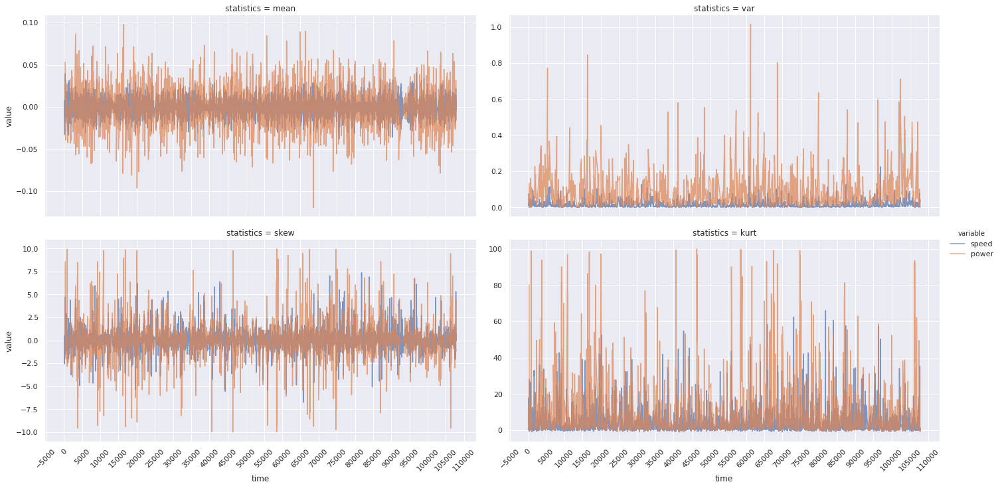

In [128]:
rdf = df['01'].apply(np.log).apply(lambda x: x-x.shift()) \
              .rolling(100).agg(['mean', 'var', 'skew', 'kurt']) \
              .stack().reset_index() \
              .rename(columns={'level_0':'time', 'level_1':'statistics', 'Nws': 'speed', 'Pwr': 'power'}) \
              .melt(id_vars=['time', 'statistics'], value_vars=['speed', 'power'])
              
r = sns.FacetGrid(rdf, col='statistics', hue='variable', sharey=False, col_wrap=2, height=5, aspect=2) \
   .map(plt.plot, 'time', 'value', alpha=0.7).add_legend().set_xticklabels(rotation=45)
for ax in r.axes:
    ax.xaxis.set_major_locator(ticker.MultipleLocator(5000))
    ax.xaxis.set_major_formatter(ticker.ScalarFormatter())
r.savefig('rolling_statistics.png')

#ax = sns.boxplot(data = np.random.rand(20,30))
#ax.xaxis.set_major_locator(ticker.MultipleLocator(5))
#ax.xaxis.set_major_formatter(ticker.ScalarFormatter())

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_bottom_axes',
 '_clean_axis',
 '_col_var',
 '_col_wrap',
 '_colors',
 '_dropna',
 '_facet_color',
 '_facet_plot',
 '_finalize_grid',
 '_get_palette',
 '_hue_var',
 '_inner_axes',
 '_left_axes',
 '_legend',
 '_legend_data',
 '_legend_out',
 '_margin_titles',
 '_n_facets',
 '_ncol',
 '_not_bottom_axes',
 '_not_left_axes',
 '_not_na',
 '_nrow',
 '_row_var',
 '_space_needed',
 '_update_legend_data',
 '_x_var',
 '_y_var',
 'add_legend',
 'ax',
 'axes',
 'col_names',
 'data',
 'despine',
 'facet_axis',
 'facet_data',
 'fig',
 'hue_kws',
 'hue_names',
 'map',
 'map_dataframe',
 'row_names',
 'savefig',
 'set',
 'set_axis_label

In [36]:
mat_subset = {tuple(key.split('_00000')[-1].split('_')):value.squeeze() for key,value in mat.items() if key[-3:] in ['Nws', 'Pwr']}
df = pd.DataFrame(mat_subset).dropna(how='all')
#data = {turbine:tdf.mean().values for turbine, tdf in df.groupby(level=0, axis=1)}
data = {turbine : [' _ '.join(['{0:.2f}'.format(moment(tdf[turbine][c].dropna(), moment=i)) 
            for i in [1,2,3]]) 
                for c in tdf[turbine]] 
                    for turbine, tdf in df.groupby(level=0, axis=1)}
gdf = pd.DataFrame(data).transpose()
gdf.columns = ['nws first 3 moments', 'pwr first 3 moments']
gdf

,nws first 3 moments,pwr first 3 moments
01,0.00 _ 7.91 _ 13.06,0.00 _ 480358.14 _ 167323569.39
02,0.00 _ 7.60 _ 16.47,0.00 _ 450418.01 _ 205843809.12
03,0.00 _ 7.77 _ 16.40,0.00 _ 456430.44 _ 200594928.18
04,0.00 _ 8.01 _ 16.02,0.00 _ 457609.92 _ 194851615.34
05,0.00 _ 8.37 _ 16.59,0.00 _ 486530.93 _ 205466841.82
06,0.00 _ 8.47 _ 17.01,0.00 _ 488181.52 _ 194424048.46
07,0.00 _ 8.81 _ 18.31,0.00 _ 489772.81 _ 212658902.33
08,0.00 _ 8.51 _ 16.92,0.00 _ 500687.82 _ 177383169.85
09,0.00 _ 8.20 _ 15.18,0.00 _ 505871.45 _ 166574304.84
10,0.00 _ 8.15 _ 15.37,0.00 _ 475281.49 _ 178062119.72


In [23]:
#--------------------------------------#
# Momentos padronizados #       
#--------------------------------------#
def his_mom(preco,k,skip=1):
    data = []
    t = preco[::skip]
    for n in range(len(t)-1):
        d = np.log(t[n+1])-np.log(t[n])
        data.append(d)                   
    mo = np.average(data)
    N = 0
    mu = 0
    s = 0
    for x in data:
        mu = mu + (x-mo)**k
        s = s + (x-mo)**2
        N = N + 1
    
    mu = float(mu)/N
    s = (float(s)/N)**(float(k)/2)
    
    # Primeiro momento cru eh a media
    # Segundo momento central eh a variancia
    # Terceiro momento normalizado eh assimetria (skewness)
    # Quarto momento normalizado eh curtose, devolve excesso
    #   -- 0: Mesocurtico, >0: Leptocurtico, <0: Platicurtico
    if k == 1:
        r = mo
    if k == 2:
        r = mu
    #r = mu #mistaken?
    if k == 3:
        r = mu/s
    if k == 4:
        r = mu/s-3
    return r

In [24]:
import numpy as np, pandas as pd
def my_mom(data,k=1,skip=1):
    data = data[::skip]
    data = (np.log(data)-np.log(data.shift(1)))[1:] #[1,2,3] becomes [0,1,2]
    N, mo = len(data), np.average(data)
    mu, s = sum((data-mo)**k)/N, (sum((data-mo)**2)/N)**(k/2.)
    return [0, mo, mu, mu/s, mu/s-3][k]

In [25]:
his_r = pd.Series(np.arange(1,10))
my_r = (np.log(data)-np.log(data.shift(1)))[1:]
print(my_mom(r,1), my_mom(r,2), my_mom(r,3), my_mom(r, 4))
print(his_mom(r,1), his_mom(r,2), his_mom(r,3), his_mom(r, 4))

0.27465307216702745 0.03283019564699991 1.3908923622806026 0.7411889312450564
0.27465307216702745 0.03283019564699991 1.3908923622806026 0.7411889312450564


In [64]:
from functools import partial
df1 = df['01']
#columns = df1.columns
#for k in np.arange(1,4):
#    for c in columns:
#        df1[f'{c}_mom_{k}'] = df1[c].rolling(2).apply(my_mom)
pd.concat([df1, df1.rolling(100).apply(my_mom, raw=False)],axis=1).head(110)

KeyboardInterrupt: 

In [42]:
mat

{'__header__': b'MATLAB 5.0 MAT-file, Platform: PCWIN, Created on: Mon Sep 24 20:17:11 2018',
 '__version__': '1.0',
 '__globals__': [],
 'Scatter880730_Renderer': array(['BREAKV1FILES'], dtype='<U12'),
 'CTS_0000000_CII_Wind_TOP78_Mean': array([[(array([[7.36828740e+05, 5.50000000e-02],
        [7.36828747e+05, 0.00000000e+00],
        [7.36828753e+05, 0.00000000e+00],
        ...,
        [7.37240990e+05, 2.67000000e+00],
        [7.37240997e+05, 2.62000000e+00],
        [7.37241003e+05, 2.08600000e+00]]), array([[nan],
        [nan],
        [nan],
        ...,
        [nan],
        [nan],
        [nan]]), array([[2]], dtype=uint8), array(['Custom'], dtype='<U6'))]],
       dtype=[('TSDataVec', 'O'), ('ResampledDataVec', 'O'), ('DataType', 'O'), ('TSType', 'O')]),
 'CTS_0000000_CI_Brisa_TOP78_Mean': array([[(array([[7.36836684e+05, 5.47200000e+00],
        [7.36836691e+05, 5.59000000e+00],
        [7.36836698e+05, 5.27100000e+00],
        ...,
        [7.37239990e+05, 5.60100000e+0

In [30]:
for key,value in mat.items():
    print(key)

__header__
__version__
__globals__
Scatter880730_Renderer
CTS_0000000_CII_Wind_TOP78_Mean
CTS_0000000_CI_Brisa_TOP78_Mean
CTS_0000000_CI_Brisa_WD75_Mean
CTS_0000000_Prod_CIII_Vento
CTS_0000000_Prod_CIII_Vento_tsc
CTS_0000000_Prod_CII_Wind
CTS_0000000_Prod_CII_Wind_tsc
CTS_0000000_Prod_CI_Brisa
CTS_0000000_Prod_CI_Brisa_tsc
CTS_0000000_WFProduction
CTS_0000000_WFProduction_tsc
PRI_0000000_NwsFarm
PRI_0000001_Alarm
PRI_0000001_Cp
PRI_0000001_Dens
PRI_0000001_Genspd
PRI_0000001_Misal
PRI_0000001_Ndir
PRI_0000001_Ndir_max
PRI_0000001_Ndir_min
PRI_0000001_Nws
PRI_0000001_Nws_dens
PRI_0000001_Nws_max
PRI_0000001_Nws_min
PRI_0000001_Nws_std
PRI_0000001_Pitch
PRI_0000001_Pitch_max
PRI_0000001_Pitch_min
PRI_0000001_Pwr
PRI_0000001_Pwr_max
PRI_0000001_Pwr_min
PRI_0000001_Pwr_std
PRI_0000001_Rotorspd
PRI_0000001_Rotorspd_max
PRI_0000001_Rotorspd_min
PRI_0000001_Temp_amb
PRI_0000001_Temp_gear
PRI_0000001_Wf
PRI_0000001_pwrExp
PRI_0000002_Alarm
PRI_0000002_Cp
PRI_0000002_Dens
PRI_0000002_Genspd
PRI

In [34]:
import pandas as pd, numpy as np
df = pd.DataFrame([[0,1,2],[3,4,5],[6,7,8],[9,10,11],[3,4,5],[0,1,2],[9,10,11],[6,7,8]], index=list('ab')*4, columns=list('ABC'))
display(df)
#for key, gdf in df.groupby(level=0):
#    print(key)
#    display(gdf)
display(df.rolling(4).agg(np.average))

,A,B,C
a,0,1,2
b,3,4,5
a,6,7,8
b,9,10,11
a,3,4,5
b,0,1,2
a,9,10,11
b,6,7,8


,A,B,C
a,NaN,NaN,NaN
b,NaN,NaN,NaN
a,NaN,NaN,NaN
b,4.50,5.50,6.50
a,5.25,6.25,7.25
b,4.50,5.50,6.50
a,5.25,6.25,7.25
b,4.50,5.50,6.50


In [33]:
(0+3+6+9)/4,(3+6+9+3)/4,(3+0+9+6)/4

(4.5, 5.25, 4.5)

In [35]:
df

,A,B,C
a,0,1,2
b,3,4,5
a,6,7,8
b,9,10,11
a,3,4,5
b,0,1,2
a,9,10,11
b,6,7,8


In [41]:
data = (np.log(data)-np.log(data.shift(1)))[1:] #[1,2,3] becomes [0,1,2]

6.987500000000001

In [48]:
np.log(7.328),np.log(1018.6250)

(1.9917026273718292, 6.926208957640384)

Random Series
 -------------
mean: 0.039 
variance: 0.962 
standard deviation: 0.981


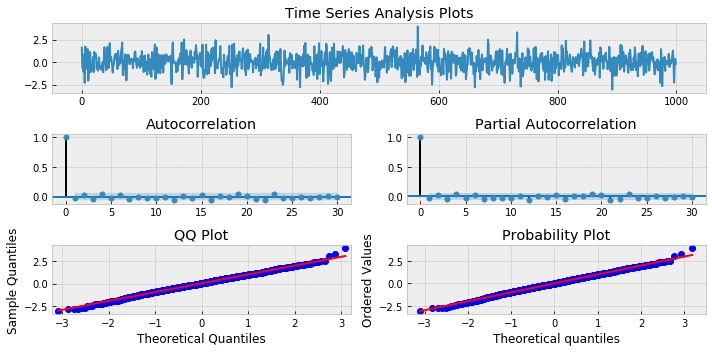

In [15]:
import pandas as pd, numpy as np, statsmodels.api as sm
import statsmodels.graphics.tsaplots as smt, scipy.stats as scs
import matplotlib.pyplot as plt

def tsplot(y, lags=None, figsize=(10,5), style='bmh'):
    y = pd.Series(y)
    with plt.style.context(style):
        fig = plt.figure(figsize=figsize)
        #mpl.rcParams['font family'] = 'Ubuntu Mono'
        layout = (3,2)
        ts_ax = plt.subplot2grid(layout, (0,0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1,0))
        pacf_ax = plt.subplot2grid(layout, (1,1))
        qq_ax = plt.subplot2grid(layout, (2,0))
        pp_ax = plt.subplot2grid(layout, (2,1))
        y.plot(ax=ts_ax)
        ts_ax.set_title('Time Series Analysis Plots')
        smt.plot_acf(y, lags=lags, ax=acf_ax, alpha=0.05)
        smt.plot_pacf(y, lags=lags, ax=pacf_ax, alpha=0.05)
        sm.qqplot(y, line='s', ax=qq_ax)
        qq_ax.set_title('QQ Plot')
        scs.probplot(y, sparams=(y.mean(), y.std()), plot=pp_ax)
        plt.tight_layout()
        
np.random.seed(1)
randser = np.random.normal(size=1000)
tsplot(randser, lags=30)

print("Random Series\n -------------\nmean: %.3f \nvariance: %.3f \nstandard deviation: %.3f"
      %(randser.mean(), randser.var(), randser.std()))

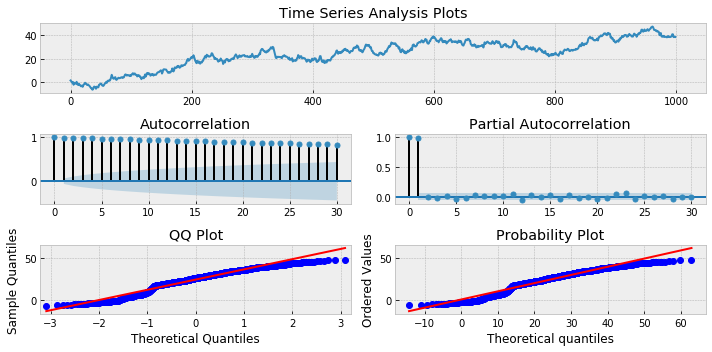

In [34]:
np.random.seed(1)
n_samples = 1000
x = w = np.random.normal(size=n_samples)
for t in range(n_samples):
    x[t] = x[t-1] + w[t]
    
tsplot(x, lags=30)

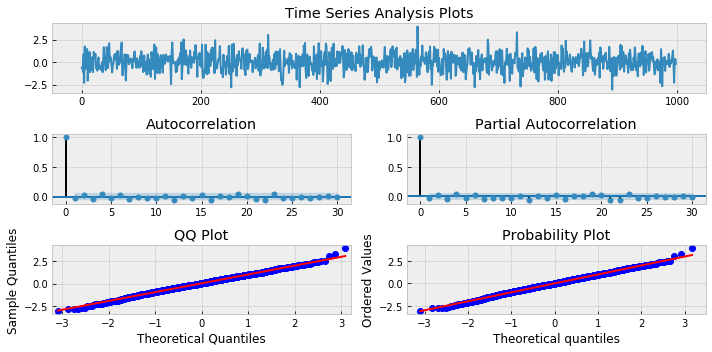

In [33]:
tsplot(np.diff(x), lags=30)

In [41]:
import pandas_datareader.data as web
spy = web.DataReader("SPY", "iex", '2015-01-01', '2019-03-13')
msft = web.DataReader("MSFT", "iex", '2015-01-01', '2019-03-13')
df = pd.concat([spy.close, msft.close],axis=1)
df.columns = ['spy', 'msft']

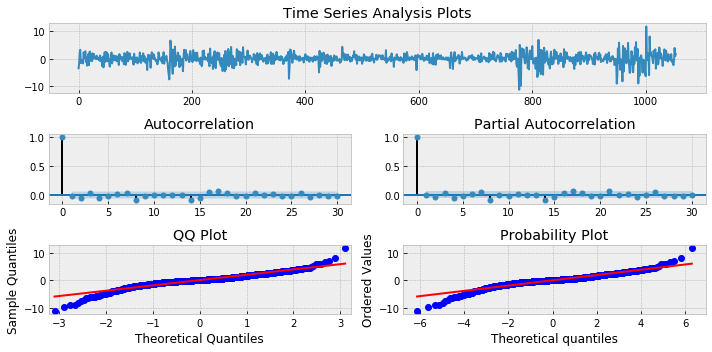

In [37]:
tsplot(np.diff(df.spy), lags=30)

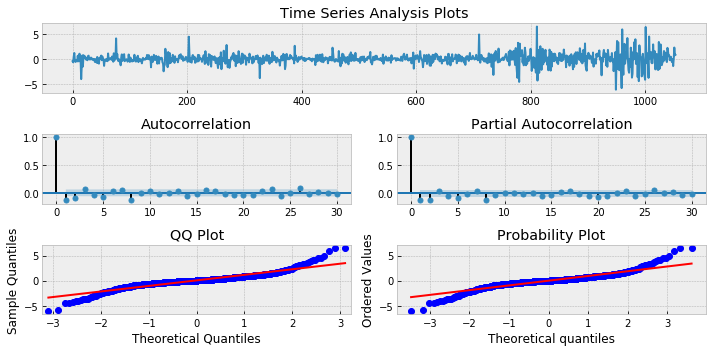

In [38]:
tsplot(np.diff(df.msft), lags=30)

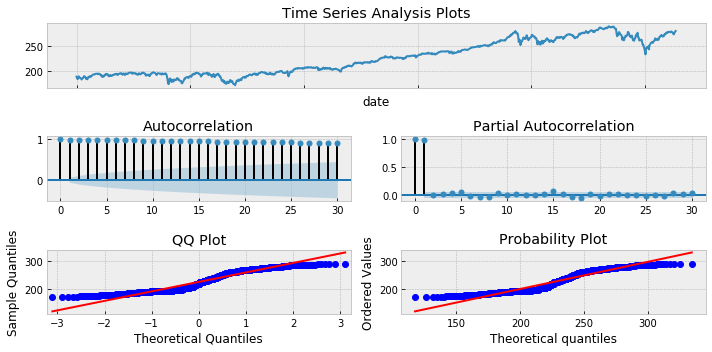

In [39]:
tsplot(df.spy, lags=30)

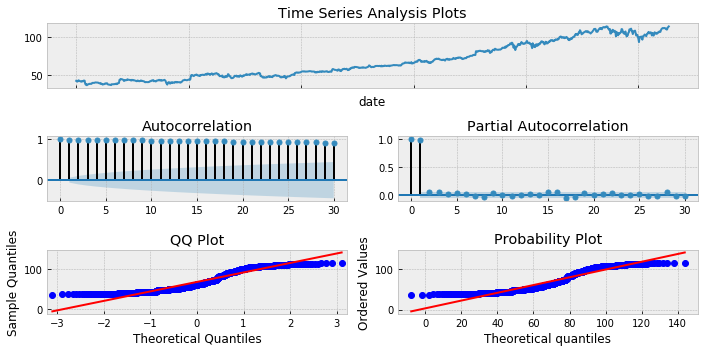

In [40]:
tsplot(df.msft, lags=30)